# VERİ YÜKLEME #

Cancer files: 182
Tumor files: 168
Aneurysm files: 168
Cancer file example:


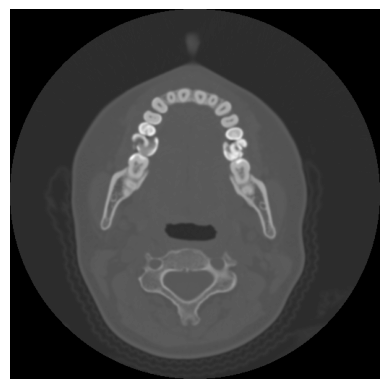

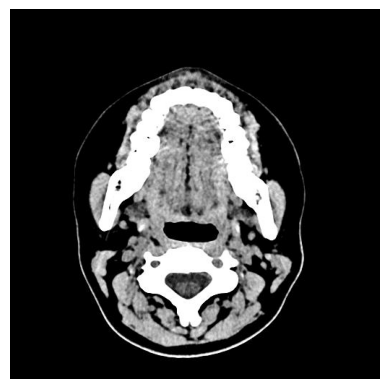

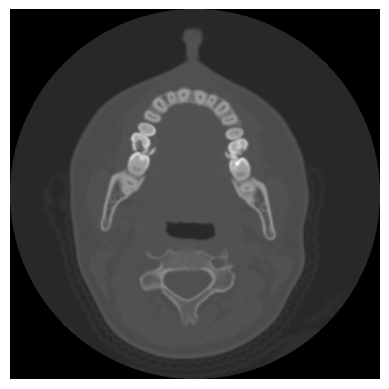

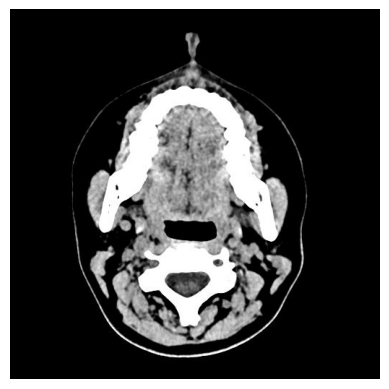

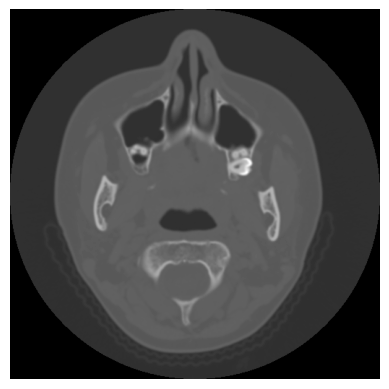

Tumor file example:


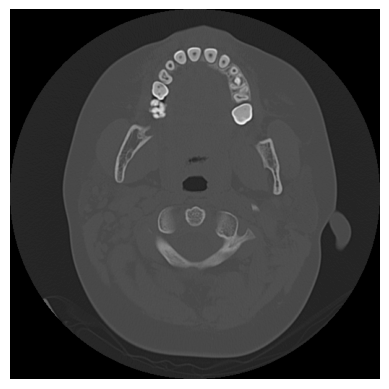

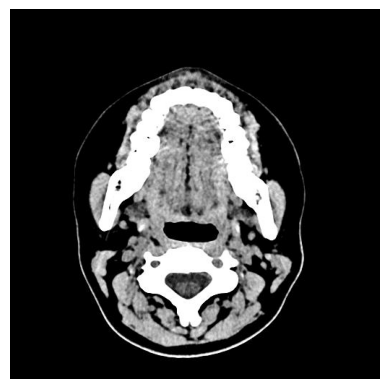

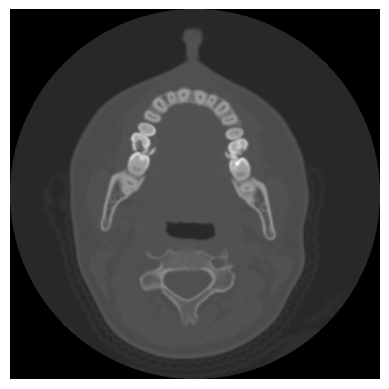

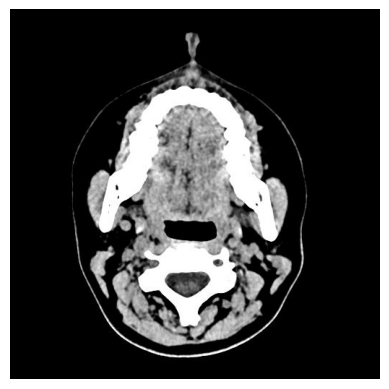

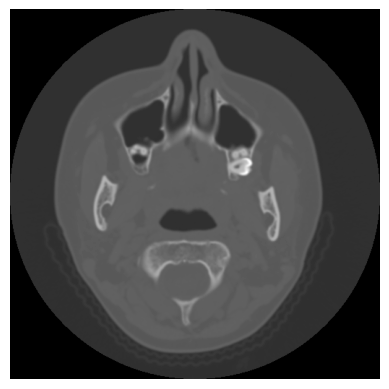

Aneurysm file example:


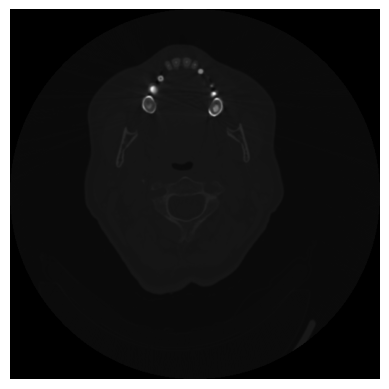

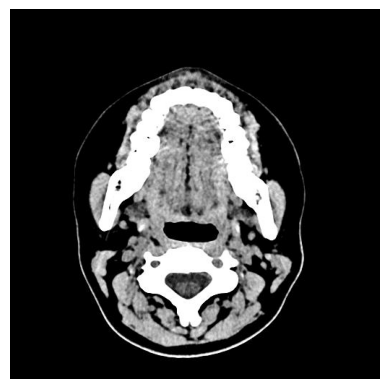

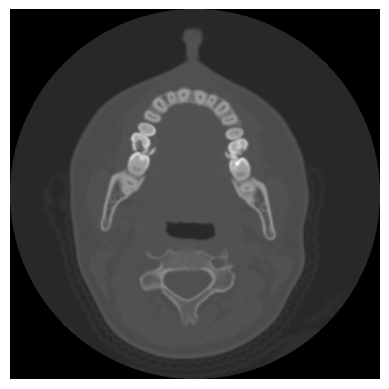

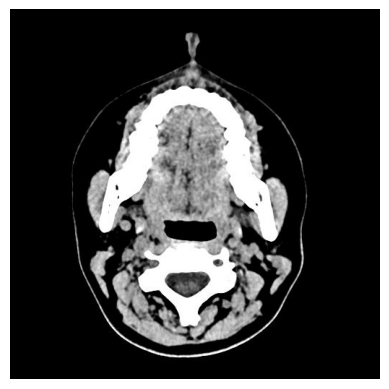

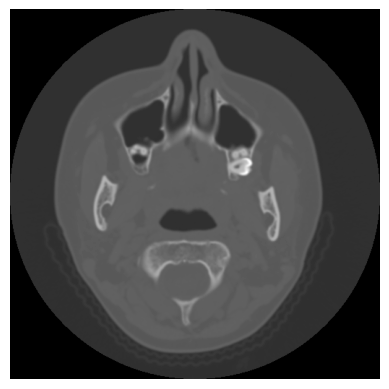

In [97]:
import os
import pydicom
import numpy as np
from skimage import io
import matplotlib.pyplot as plt

def load_cancer_data(directory_path):
    cancer_files = []
    for file in os.listdir(directory_path):
        if file.endswith('.dcm') or file.endswith('.jpg'):
            cancer_files.append(os.path.join(directory_path, file))
    return cancer_files

def load_tumor_data(directory_path):
    tumor_files = []
    for file in os.listdir(directory_path):
        if file.endswith('.dcm') or file.endswith('.jpg'):
            tumor_files.append(os.path.join(directory_path, file))
    return tumor_files

def load_aneurysm_data(directory_path):
    anerysm_files = []
    for file in os.listdir(directory_path):
        if file.endswith('.dcm') or file.endswith('.jpg'):
            aneurysm_files.append(os.path.join(directory_path, file))
    return aneurysm_files

def display_image(image_path):
    """Görüntüyü yükler ve gösterir."""
    if image_path.endswith('.dcm'):  # DICOM dosyası ise
        dicom_image = pydicom.dcmread(image_path)
        img = dicom_image.pixel_array
        plt.imshow(img, cmap='gray')
    else:  # JPG dosyası ise
        img = io.imread(image_path)
        plt.imshow(img)
    plt.axis('off')  # Ekseni gizler
    plt.show()

# Kullanım örneği
cancer_directory = 'C:\\Users\\merve\\Downloads\\veriseti1\\files\\cancer'
tumor_directory = 'C:\\Users\\merve\\Downloads\\veriseti1\\files\\tumor'
aneurysm_directory = 'C:\\Users\\merve\\Downloads\\veriseti1\\files\\aneurysm'

cancer_files = load_cancer_data(cancer_directory)
tumor_files = load_tumor_data(tumor_directory)
aneurysm_files = load_anerysm_data(aneurysm_directory)

print(f"Cancer files: {len(cancer_files)}")
print(f"Tumor files: {len(tumor_files)}")
print(f"Aneurysm files: {len(aneurysm_files)}")

# Örnek olarak ilk görüntüleri görüntüleme
if cancer_files:
    print("Cancer file example:")
    display_image(cancer_files[0])
    display_image(cancer_files[1])
    display_image(cancer_files[2])
    display_image(cancer_files[3])
    display_image(cancer_files[4])
    
if tumor_files:
    print("Tumor file example:")
    display_image(tumor_files[0])
    display_image(cancer_files[1])
    display_image(cancer_files[2])
    display_image(cancer_files[3])
    display_image(cancer_files[4])

if aneurysm_files:
    print("Aneurysm file example:")
    display_image(aneurysm_files[0])
    display_image(cancer_files[1])
    display_image(cancer_files[2])
    display_image(cancer_files[3])
    display_image(cancer_files[4])

# ÖN İŞLEMLER #

C:\Users\merve\.nuget\anaconda\Lib\site-packages\skimage\_shared\utils.py:438: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel, or set channel_axis.
  return func(*args, **kwargs)


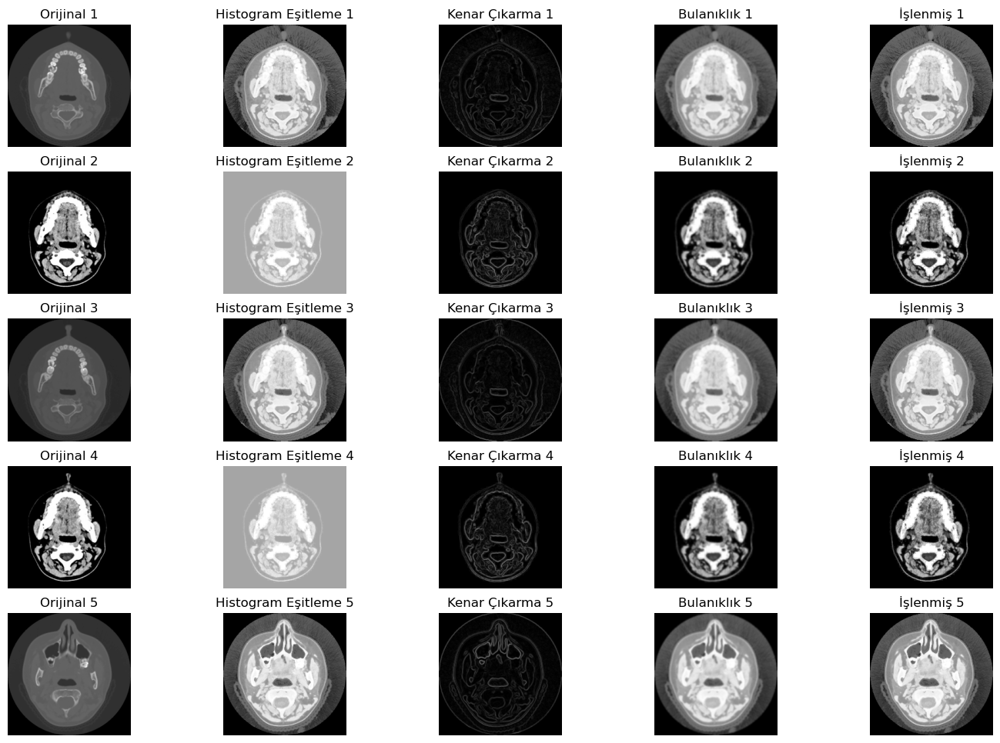

In [98]:
import numpy as np
from skimage import io, transform, exposure, filters
from skimage.filters import sobel, gaussian
import matplotlib.pyplot as plt
import pydicom  # Eğer DICOM verileriyle çalışıyorsanız
import os

def preprocess_image(image_path, target_size=(224, 224)):
    """Görüntü üzerinde ön işleme işlemleri yapar."""
    # Görüntüyü yükle
    if image_path.endswith('.dcm'):  # DICOM dosyası ise
        dicom_image = pydicom.dcmread(image_path)
        img = dicom_image.pixel_array
    else:  # JPG dosyası ise
        img = io.imread(image_path)
    
    # Boyutlandırma (224x224)
    resized_image = transform.resize(img, target_size, anti_aliasing=True)
    
    # Histogram Eşitleme
    equalized_image = exposure.equalize_hist(resized_image)  # Kontrast artırma
    
    # Normalizasyon
    normalized_image = (equalized_image - np.min(equalized_image)) / (np.max(equalized_image) - np.min(equalized_image))
    
    # Kenar çıkarımı
    edge_image = sobel(normalized_image)
    
    # Bulanıklık uygulama (Gaussian)
    blurred_image = gaussian(normalized_image, sigma=1)
    
    # RGB'ye dönüştürme (Gri tonlamalı ise)
    if len(normalized_image.shape) == 2:
        normalized_image = np.stack([normalized_image] * 3, axis=-1)  # RGB'ye dönüştür
        edge_image = np.stack([edge_image] * 3, axis=-1)
        blurred_image = np.stack([blurred_image] * 3, axis=-1)
    
    # Görüntüleri dstack ile birleştir
    processed_image = np.dstack((normalized_image, edge_image, blurred_image))
    
    return resized_image, equalized_image, edge_image, blurred_image, processed_image

def preprocess_images(image_paths, target_size=(224, 224)):
    """Birden fazla görüntüyü ön işler."""
    original_images, equalized_images, edge_images, blurred_images, processed_images = [], [], [], [], []
    for path in image_paths:
        o, e, ed, b, p = preprocess_image(path, target_size)
        original_images.append(o)
        equalized_images.append(e)
        edge_images.append(ed)
        blurred_images.append(b)
        processed_images.append(p)
    return original_images, equalized_images, edge_images, blurred_images, processed_images

def display_processed_images(original_images, equalized_images, edge_images, blurred_images, processed_images, num_images=5):
    """Orijinal ve ön işlenmiş görüntüleri aynı satırda yan yana görselleştirir."""
    plt.figure(figsize=(18, 12))  # Görselleştirme boyutunu büyüttük

    for i in range(num_images):
        # Orijinal Görüntü
        plt.subplot(num_images, 5, i * 5 + 1)  # Orijinal Görüntü
        plt.imshow(original_images[i], cmap='gray' if len(original_images[i].shape) == 2 else None)
        plt.title(f"Orijinal {i+1}")
        plt.axis("off")
        
        # Histogram Eşitleme Görüntüsü
        plt.subplot(num_images, 5, i * 5 + 2)  # Histogram Eşitleme
        plt.imshow(equalized_images[i], cmap='gray' if len(equalized_images[i].shape) == 2 else None)
        plt.title(f"Histogram Eşitleme {i+1}")
        plt.axis("off")
        
        # Kenar Çıkarma Görüntüsü
        plt.subplot(num_images, 5, i * 5 + 3)  # Kenar Çıkarma
        plt.imshow(edge_images[i], cmap='gray')
        plt.title(f"Kenar Çıkarma {i+1}")
        plt.axis("off")
        
        # Bulanıklık Görüntüsü
        plt.subplot(num_images, 5, i * 5 + 4)  # Bulanıklık
        plt.imshow(blurred_images[i], cmap='gray')
        plt.title(f"Bulanıklık {i+1}")
        plt.axis("off")
        
        # İşlenmiş Görüntü (Normalizasyon + Kenar Çıkarma + Bulanıklık)
        plt.subplot(num_images, 5, i * 5 + 5)  # İşlenmiş Görüntü
        rgb_image = processed_images[i][:, :, :3]  # RGB'yi görselleştir
        plt.imshow(rgb_image)
        plt.title(f"İşlenmiş {i+1}")
        plt.axis("off")

    # Alt boşlukları kaldır ve yatay boşluğu azalt
    plt.subplots_adjust(wspace=0.02, hspace=0.2)  # Yatay boşluğu daha da azaltarak görselleri daha yakın yap
    plt.show()

# Örnek Kullanım:
cancer_directory = 'C:\\Users\\merve\\Downloads\\veriseti1\\files\\cancer'
tumor_directory = 'C:\\Users\\merve\\Downloads\\veriseti1\\files\\tumor'
aneurysm_directory = 'C:\\Users\\merve\\Downloads\\veriseti1\\files\\aneurysm'

# Görüntüleri yükleme
cancer_files = [f"{cancer_directory}\\{filename}" for filename in os.listdir(cancer_directory)]
tumor_files = [f"{tumor_directory}\\{filename}" for filename in os.listdir(tumor_directory)]
aneurysm_files = [f"{aneurysm_directory}\\{filename}" for filename in os.listdir(aneurysm_directory)]

# Görüntüleri ön işleme
cancer_images = preprocess_images(cancer_files, target_size=(224, 224))
tumor_images = preprocess_images(tumor_files, target_size=(224, 224))
aneurysm_images = preprocess_images(aneurysm_files, target_size=(224, 224))

# Ön işlemlerden geçmiş ilk 5 görüntüyü yazdırma
display_processed_images(cancer_images[0], cancer_images[1], cancer_images[2], cancer_images[3], cancer_images[4], num_images=5)

# ÖZELLİK ÇIKARMA #

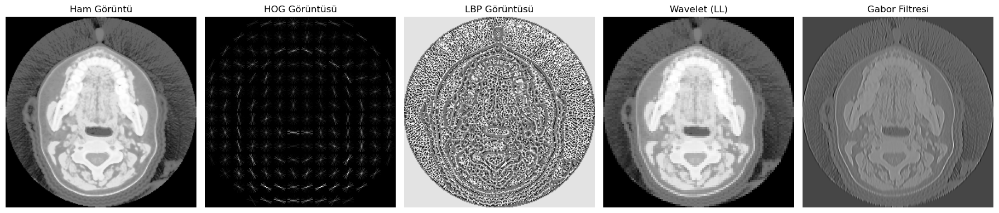

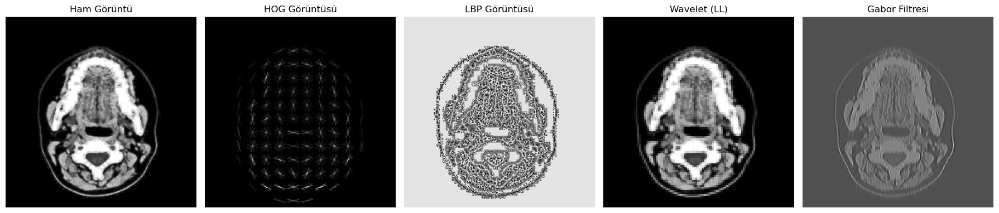

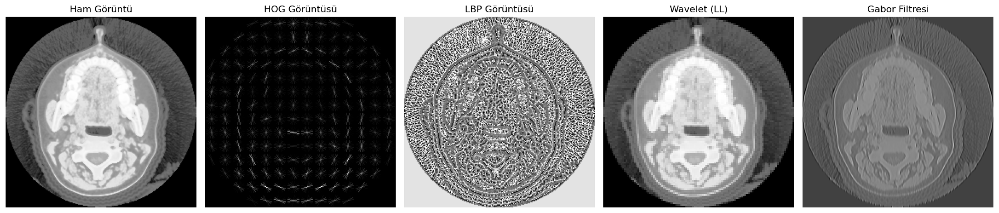

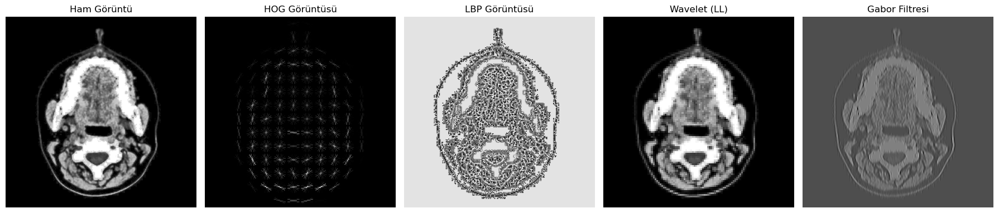

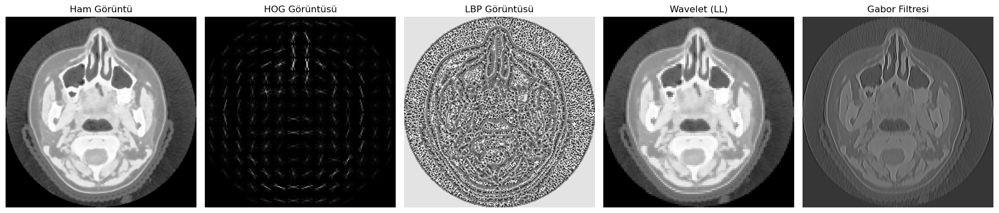

...

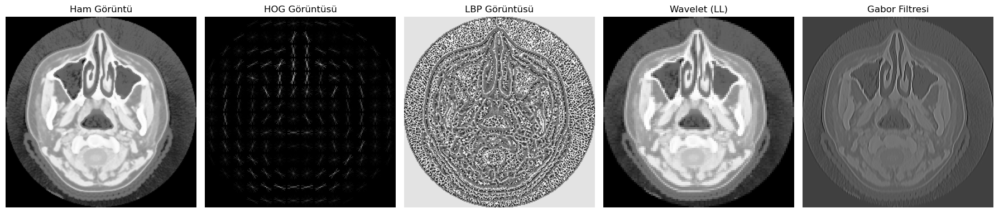

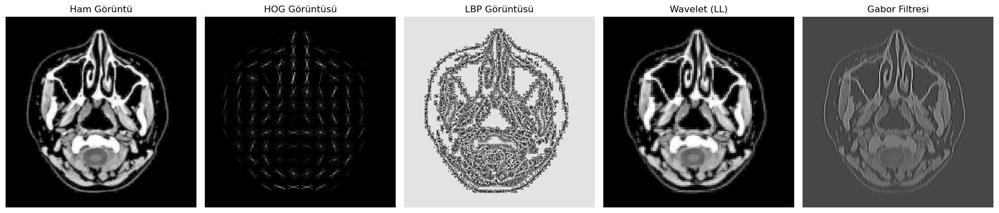

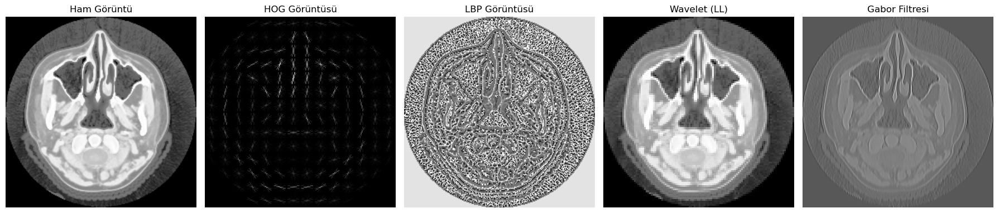

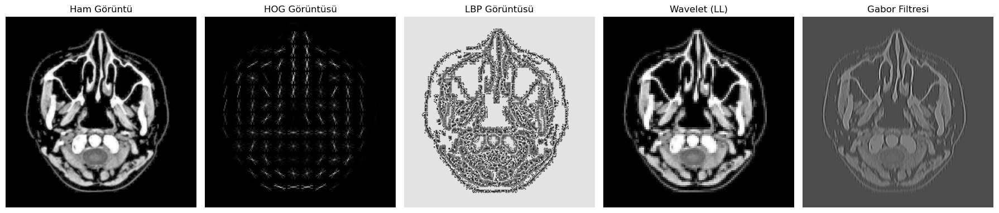

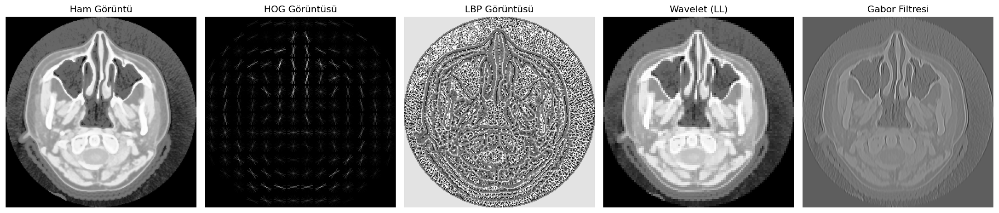

In [99]:
from skimage.color import rgb2gray  # Gri tonlamaya dönüştürmek için
from skimage.feature import hog, local_binary_pattern
from skimage.filters import gabor
from skimage import exposure
import pywt  # Wavelet için
import numpy as np
import matplotlib.pyplot as plt

def extract_features_from_processed_image(processed_image):
    """
    Tek bir işlenmiş görüntüden özellikleri çıkarır.
    """
    # Eğer görüntü gri tonlamalı (2D) ise, RGB kanallarını ayırmaya gerek yok
    if len(processed_image.shape) == 3:  # 3 boyutlu görüntü (RGB)
        rgb_channels = processed_image[:, :, :3]
        edge_channel = processed_image[:, :, 3]  # Kenar kanalı
    else:  # 2 boyutlu (gri tonlamalı veya sadece kenar kanalı)
        rgb_channels = np.stack([processed_image] * 3, axis=-1)  # Görüntüyü RGB'ye dönüştür
        edge_channel = processed_image  # Kenar kanalı olarak gri tonlamayı kullan

    # Histogram özellikleri
    gray_image = rgb_channels[:, :, 0]  # R kanalını gri tonlama için kullan
    hist, bins = np.histogram(gray_image, bins=32, range=(0, 1))
    
    # Geriye döndürülen özellikler
    return hist, edge_channel

def display_extracted_features(processed_image, feature_vector):
    """
    Çıkarılan özelliklerin görselleştirilmesi.
    """
    # RGB kanalları
    rgb_channels = processed_image[:, :, :3]

    # HOG Özellik Görselleştirmesi
    fd, hog_image = hog(rgb_channels[:, :, 0], orientations=8, pixels_per_cell=(16, 16), cells_per_block=(1, 1), visualize=True)
    hog_image_rescaled = exposure.rescale_intensity(hog_image, in_range=(0, 10))

    # LBP (Local Binary Pattern) Görselleştirmesi
    lbp = local_binary_pattern((rgb_channels[:, :, 0] * 255).astype(np.uint8), P=8, R=1, method='uniform')

    # Histogram Özellik Çıkarımı
    gray_image = rgb2gray(rgb_channels)  # Gri tonlamaya dönüştürme
    hist, bins = np.histogram(gray_image, bins=32, range=(0, 1))

    # Dalgacık Dönüşümü ile Özellik Çıkarımı (Wavelet)
    coeffs = pywt.dwt2(gray_image, 'haar')  # Haar dalgacığı dönüşümü
    LL, (LH, HL, HH) = coeffs  # LL, LH, HL, HH bileşenleri
    wavelet_feature = np.concatenate([LL.flatten(), LH.flatten(), HL.flatten(), HH.flatten()])

    # Gabor Filtresi ile Özellik Çıkarımı
    filt_real, filt_imag = gabor(gray_image, frequency=0.6)
    
    # Görselleştirme Başlangıcı
    fig, axes = plt.subplots(1, 5, figsize=(18, 6))  # 1 satır, 5 sütun

    # Görselleştirme: Ham Görüntü
    axes[0].imshow(rgb_channels)
    axes[0].set_title("Ham Görüntü")
    axes[0].axis('off')
    
    # Görselleştirme: HOG
    axes[1].imshow(hog_image_rescaled, cmap=plt.cm.gray)
    axes[1].set_title("HOG Görüntüsü")
    axes[1].axis('off')
    
    # Görselleştirme: LBP
    axes[2].imshow(lbp, cmap=plt.cm.gray)
    axes[2].set_title("LBP Görüntüsü")
    axes[2].axis('off')
    
    # Görselleştirme: Dalgacık Dönüşümü (Wavelet)
    axes[3].imshow(LL, cmap=plt.cm.gray)
    axes[3].set_title("Wavelet (LL)")
    axes[3].axis('off')

    # Görselleştirme: Gabor Filtresi
    axes[4].imshow(filt_real, cmap=plt.cm.gray)
    axes[4].set_title("Gabor Filtresi")
    axes[4].axis('off')

    plt.tight_layout()
    plt.show()

# Kullanım örneği:
# Önceden işlenmiş görüntülerinizi ve çıkarılan özelliklerinizi kullanarak görselleştirme yapabilirsiniz:
for i in range(15):
    # 5. görüntü için işleme ve özellik çıkarımı
    processed_image = cancer_images[4][i]  # 4. ön işleme çıktısını ve her görüntüyü al
    feature_vector = extract_features_from_processed_image(processed_image)
    
    # Görselleştirme
    display_extracted_features(processed_image, feature_vector)

**Histogram Özellikleri:**

**Amaç:** 
Görüntüdeki renk dağılımını anlamak.

**Nasıl Çalışır:**
Her bir RGB kanalının (kırmızı, yeşil, mavi) için 32 sınıfa ayrılan histogramlar hesaplanır. Histogramlar normalize edilerek özellik vektörüne eklenir.

**HOG (Histogram of Oriented Gradients) Özellikleri:**

**Amaç:** 
Görüntüdeki şekil ve desenlerin yönelimlerini analiz etmek.

**Nasıl Çalışır:** 
Görüntünün yöresel gradyanları hesaplanır ve bu gradyanların yönelimleri üzerinden bir histogram çıkarılır. Bu histogram, görüntüdeki kenarların yönelimini temsil eder.

**LBP (Local Binary Pattern) Özellikleri:**

**Amaç:**
Görüntünün yerel dokusunu analiz etmek.

**Nasıl Çalışır:**
Her piksel için komşu piksellerle karşılaştırma yapılarak bir ikili desen oluşturulur. Bu desenlerin histogramı çıkarılır ve normalize edilir.

# VERİ ETİKETLEME #

In [ ]:
import os
import numpy as np
from PIL import Image
import pydicom
import matplotlib.pyplot as plt
from skimage import exposure, filters
from skimage.filters import sobel, gaussian

def load_image(file_path, target_size=(512, 512)):
    """
    Görüntüyü yükler (DICOM veya JPG) ve yeniden boyutlandırır.
    """
    if file_path.lower().endswith('.dcm'):  # Eğer dosya DICOM ise
        dicom_image = pydicom.dcmread(file_path)
        img = dicom_image.pixel_array  # DICOM verisini al
        img = np.uint8(img)  # DICOM verisi genellikle float veya integer olabilir, uint8'e dönüştür
    else:  # JPG veya diğer resimler
        img = Image.open(file_path)
        img = np.array(img)  # PIL ile okunan görüntü numpy array'ine dönüştürülür
    
    # Boyutlandırma işlemi
    img = Image.fromarray(img)  # Numpy array'ini tekrar PIL image formatına dönüştür
    img = img.resize(target_size)  # Görüntüyü hedef boyuta yeniden boyutlandırma
    img = np.array(img)  # Yeniden boyutlandırılmış görüntüyü numpy dizisine dönüştürme
    
    return img

def preprocess_image(image_path, target_size=(512, 512)):
    """Görüntü üzerinde ön işleme işlemleri yapar."""
    # Görüntüyü yükle
    img = load_image(image_path, target_size)
    
    # Histogram Eşitleme
    equalized_image = exposure.equalize_hist(img)
    
    # Normalizasyon
    normalized_image = (equalized_image - np.min(equalized_image)) / (np.max(equalized_image) - np.min(equalized_image))
    
    # Kenar çıkarımı
    edge_image = sobel(normalized_image)
    
    # Bulanıklık uygulama (Gaussian)
    blurred_image = gaussian(normalized_image, sigma=1)
    
    # Görüntüleri RGB'ye dönüştürme (Gri tonlamalı ise)
    if len(normalized_image.shape) == 2:
        normalized_image = np.stack([normalized_image] * 3, axis=-1)  # RGB'ye dönüştür
        edge_image = np.stack([edge_image] * 3, axis=-1)
        blurred_image = np.stack([blurred_image] * 3, axis=-1)
    
    # Görüntüleri dstack ile birleştir
    processed_image = np.dstack((normalized_image, edge_image, blurred_image))
    
    return processed_image

def load_images_and_labels(dataset_path):
    images = []
    labels = []
    paths = []  # Görüntü dosya yollarını da sakla
    label_map = {'cancer': 0, 'tumor': 1, 'aneurysm': 2}  # Klasör isimlerine göre etiketler
    reverse_label_map = {v: k for k, v in label_map.items()}  # Etiketten isme dönüşüm haritası

    for folder_name in os.listdir(dataset_path):
        folder_path = os.path.join(dataset_path, folder_name)
        print(f"Kontrol edilen klasör: {folder_name}")  # Debug çıktısı
        if os.path.isdir(folder_path):
            if folder_name in label_map:  # Klasör ismini kontrol et
                label = label_map[folder_name]  # Klasör ismine göre etiket belirle
                print(f"Klasör bulundu, etiket: {label} ({reverse_label_map[label]})")  # Debug çıktısı
                for filename in os.listdir(folder_path):
                    file_path = os.path.join(folder_path, filename)
                    if file_path.lower().endswith(('.dcm', '.jpg')):  # DICOM veya JPG dosyalarını al
                        image = preprocess_image(file_path)  # Görüntüyü yükleyin ve ön işleme yapın
                        if image.shape == (512, 512, 3):  # Görüntü boyutunun 512x512 olduğundan emin ol
                            images.append(image)
                            labels.append(label)
                            paths.append(file_path)
    return np.array(images), np.array(labels), paths, reverse_label_map

def extract_features_from_processed_image(processed_image):
    """Tek bir işlenmiş görüntüden özellik çıkarır."""
    # İşlenmiş görüntüdeki RGB kanallarını ayırma
    rgb_channels = processed_image[:, :, :3]  # İlk üç kanalı al
    
    # Kenar kanalı
    edge_channel = processed_image[:, :, 3]  # Dördüncü kanal
    
    # Örnek: Histogram özellikleri
    hist_features = np.histogram(rgb_channels, bins=256, range=(0, 255))  # Örnek histogram çıkarımı

    return hist_features  # Çıkarılan özellikleri döndür

def extract_features_from_processed_images(processed_images):
    """Birden fazla işlenmiş görüntüden özellikleri çıkarır."""
    features_list = []
    for image in processed_images:
        features = extract_features_from_processed_image(image)
        features_list.append(features)
    return np.array(features_list)

# Etiketler ve görüntüler yüklendi
path_to_train_dataset = 'C:\\Users\\merve\\Downloads\\veriseti1\\files\\'
images, labels, paths, reverse_label_map = load_images_and_labels(path_to_train_dataset)

# Örnek görüntüleri görselleştirme
print("Örnek Görüntüler ve Etiketler:")
for i in range(min(5, len(images))):  # 5 veya mevcut görüntü sayısı kadar görselleştir
    label_name = reverse_label_map[labels[i]]  # Etiketi isimle eşleştir
    print(f"Görüntü {i+1}: Etiket = {labels[i]} ({label_name}), Dosya Yolu = {paths[i]}")
    
    # Görüntüyü görselleştir
    plt.figure(figsize=(8, 4))
    plt.imshow(images[i], cmap='gray')  # Görüntüyü gri tonlamalı göster
    plt.title(f"Etiket: {label_name} (Görüntü {i+1})")
    plt.axis('off')
    plt.show()

# Örnek olarak işlenmiş görüntülerden özellik çıkarımı
features = extract_features_from_processed_images(images)

# Özelliklerin çıktısını kontrol et
print(f"Extracted Features: {features.shape}")

Kontrol edilen klasör: aneurysm
Klasör bulundu, etiket: 2 (aneurysm)


# Boyutları Kontrol Etme ve Düzenleme #

In [ ]:
import numpy as np
from skimage import io, transform, exposure, filters
from skimage.filters import sobel, gaussian
import matplotlib.pyplot as plt
import pydicom  # Eğer DICOM verileriyle çalışıyorsanız
import os

def preprocess_image(image_path, target_size=(224, 224)):
    """Görüntü üzerinde ön işleme işlemleri yapar."""
    # Görüntüyü yükle
    if image_path.endswith('.dcm'):  # DICOM dosyası ise
        dicom_image = pydicom.dcmread(image_path)
        img = dicom_image.pixel_array
    else:  # JPG dosyası ise
        img = io.imread(image_path)
    
    # Boyutlandırma (224x224)
    resized_image = transform.resize(img, target_size, anti_aliasing=True)
    
    # Histogram Eşitleme
    equalized_image = exposure.equalize_hist(resized_image)  # Kontrast artırma
    
    # Normalizasyon
    normalized_image = (equalized_image - np.min(equalized_image)) / (np.max(equalized_image) - np.min(equalized_image))
    
    # Kenar çıkarımı
    edge_image = sobel(normalized_image)
    
    # Bulanıklık uygulama (Gaussian)
    blurred_image = gaussian(normalized_image, sigma=1)
    
    # RGB'ye dönüştürme (Gri tonlamalı ise)
    if len(normalized_image.shape) == 2:
        normalized_image = np.stack([normalized_image] * 3, axis=-1)  # RGB'ye dönüştür
        edge_image = np.stack([edge_image] * 3, axis=-1)
        blurred_image = np.stack([blurred_image] * 3, axis=-1)
    
    # Görüntüleri dstack ile birleştir
    processed_image = np.dstack((normalized_image, edge_image, blurred_image))
    
    # processed_image'ın numpy array olmasını sağlamak
    processed_image = np.array(processed_image)
    
    return resized_image, equalized_image, edge_image, blurred_image, processed_image

def preprocess_images(image_paths, target_size=(224, 224)):
    """Birden fazla görüntüyü ön işler."""
    original_images, equalized_images, edge_images, blurred_images, processed_images = [], [], [], [], []
    for path in image_paths:
        o, e, ed, b, p = preprocess_image(path, target_size)
        original_images.append(o)
        equalized_images.append(e)
        edge_images.append(ed)
        blurred_images.append(b)
        processed_images.append(p)
    return original_images, equalized_images, edge_images, blurred_images, processed_images

def extract_features_from_processed_image(processed_image):
    """
    Tek bir işlenmiş görüntüden özellikleri çıkarır.
    """
    # RGB kanallarını ayırma
    processed_image = np.array(processed_image)  # Eğer işlemde hala liste varsa numpy dizisine dönüştür
    rgb_channels = processed_image[:, :, :3]
    edge_channel = processed_image[:, :, -1]  # Kenar kanalı

    # Histogram özellikleri
    hist_features = []
    for channel in range(3):  # RGB kanalları için ayrı ayrı
        hist, _ = np.histogram(rgb_channels[:, :, channel], bins=32, range=(0, 1))
        hist_features.extend(hist)
    hist_features = np.array(hist_features) / np.sum(hist_features)  # Normalize histogram

    # Kenar bilgisi özellikleri
    edge_mean = np.mean(edge_channel)
    edge_std = np.std(edge_channel)

    # Doku özellikleri (örnek olarak ortalama ve varyans)
    texture_mean = np.mean(rgb_channels)
    texture_std = np.std(rgb_channels)

    # Şekil özellikleri (örnek olarak toplam kenar yoğunluğu)
    edge_density = np.sum(edge_channel) / edge_channel.size

    # Tüm özellikleri birleştirerek bir özellik vektörü döndür
    feature_vector = np.concatenate([hist_features, 
                                     [edge_mean, edge_std, texture_mean, texture_std, edge_density]])
    return feature_vector

def extract_features_from_processed_images(processed_images):
    """
    Birden fazla işlenmiş görüntüden özellikleri çıkarır.
    """
    features_list = []
    for image in processed_images:
        features = extract_features_from_processed_image(image)
        features_list.append(features)
    return np.array(features_list)  # Özelliklerin bir numpy dizisi olarak döndürülmesi

# Görüntü dosyalarının yolu
cancer_directory = 'C:\\Users\\merve\\Downloads\\veriseti1\\files\\cancer'
tumor_directory = 'C:\\Users\\merve\\Downloads\\veriseti1\\files\\tumor'
aneurysm_directory = 'C:\\Users\\merve\\Downloads\\veriseti1\\files\\aneurysm'

# Görüntüleri yükleme
cancer_files = [f"{cancer_directory}\\{filename}" for filename in os.listdir(cancer_directory)]
tumor_files = [f"{tumor_directory}\\{filename}" for filename in os.listdir(tumor_directory)]
aneurysm_files = [f"{aneurysm_directory}\\{filename}" for filename in os.listdir(aneurysm_directory)]

# Görüntüleri ön işleme
cancer_images = preprocess_images(cancer_files, target_size=(224, 224))
tumor_images = preprocess_images(tumor_files, target_size=(224, 224))
aneurysm_images = preprocess_images(aneurysm_files, target_size=(224, 224))

# Özellik çıkarımı
cancer_features = extract_features_from_processed_images(cancer_images[4])  # 4. görüntü için
tumor_features = extract_features_from_processed_images(tumor_images[4])    # 4. görüntü için
aneurysm_features = extract_features_from_processed_images(aneurysm_images[4]) # 4. görüntü için

# Boyutları kontrol etme
print(f"Kanser özellik boyutu: {cancer_features.shape}")
print(f"Tümör özellik boyutu: {tumor_features.shape}")
print(f"Anevrizma özellik boyutu: {aneurysm_features.shape}")

# Özelliklerin birleşimi
if cancer_features.shape[1] == tumor_features.shape[1] == aneurysm_features.shape[1]:
    X = np.concatenate([cancer_features, tumor_features, aneurysm_features], axis=0)
    y = np.array([0] * len(cancer_features) + [1] * len(tumor_features) + [2] * len(aneurysm_features))  # Etiketler

In [ ]:
import numpy as np
from skimage import io, transform, exposure, filters
from skimage.filters import sobel, gaussian
import pydicom  # Eğer DICOM verileriyle çalışıyorsanız
import os

def preprocess_image(image_path, target_size=(224, 224)):
    """Görüntü üzerinde ön işleme işlemleri yapar."""
    # Görüntüyü yükle
    if image_path.endswith('.dcm'):  # DICOM dosyası ise
        dicom_image = pydicom.dcmread(image_path)
        img = dicom_image.pixel_array
    else:  # JPG dosyası ise
        img = io.imread(image_path)
    
    # Boyutlandırma (224x224)
    resized_image = transform.resize(img, target_size, anti_aliasing=True)
    
    # Histogram Eşitleme
    equalized_image = exposure.equalize_hist(resized_image)  # Kontrast artırma
    
    # Normalizasyon
    normalized_image = (equalized_image - np.min(equalized_image)) / (np.max(equalized_image) - np.min(equalized_image))
    
    # Kenar çıkarımı
    edge_image = sobel(normalized_image)
    
    # Bulanıklık uygulama (Gaussian)
    blurred_image = gaussian(normalized_image, sigma=1)
    
    # RGB'ye dönüştürme (Gri tonlamalı ise)
    if len(normalized_image.shape) == 2:
        normalized_image = np.stack([normalized_image] * 3, axis=-1)  # RGB'ye dönüştür
        edge_image = np.stack([edge_image] * 3, axis=-1)
        blurred_image = np.stack([blurred_image] * 3, axis=-1)
    
    # Görüntüleri dstack ile birleştir
    processed_image = np.dstack((normalized_image, edge_image, blurred_image))
    
    # İşlenmiş görüntünün boyutunu kontrol et
    processed_image = np.array(processed_image)
    assert processed_image.shape == (target_size[0], target_size[1], 9), f"Beklenen boyut: {(target_size[0], target_size[1], 9)}, Bulunan boyut: {processed_image.shape}"
    
    return resized_image, equalized_image, edge_image, blurred_image, processed_image

def extract_features_from_processed_image(processed_image):
    """
    Tek bir işlenmiş görüntüden özellikleri çıkarır.
    """
    processed_image = np.array(processed_image)  # Görüntülerin doğru şekilde numpy dizisine dönüştürülmesi

    # RGB kanallarını ayırma
    rgb_channels = processed_image[:, :, :3]
    edge_channel = processed_image[:, :, -1]  # Kenar kanalı

    # Histogram özellikleri
    hist_features = []
    for channel in range(3):  # RGB kanalları için ayrı ayrı
        hist, _ = np.histogram(rgb_channels[:, :, channel], bins=32, range=(0, 1))
        hist_features.extend(hist)
    hist_features = np.array(hist_features) / np.sum(hist_features)  # Normalize histogram

    # Kenar bilgisi özellikleri
    edge_mean = np.mean(edge_channel)
    edge_std = np.std(edge_channel)

    # Doku özellikleri (örnek olarak ortalama ve varyans)
    texture_mean = np.mean(rgb_channels)
    texture_std = np.std(rgb_channels)

    # Şekil özellikleri (örnek olarak toplam kenar yoğunluğu)
    edge_density = np.sum(edge_channel) / edge_channel.size

    # Tüm özellikleri birleştirerek bir özellik vektörü döndür
    feature_vector = np.concatenate([hist_features, 
                                     [edge_mean, edge_std, texture_mean, texture_std, edge_density]])
    return feature_vector

def extract_features_from_processed_images(processed_images):
    """
    Birden fazla işlenmiş görüntüden özellikleri çıkarır.
    """
    features_list = []
    for image in processed_images:
        features = extract_features_from_processed_image(image)
        features_list.append(features)
    return np.array(features_list)  # Özelliklerin bir numpy dizisi olarak döndürülmesi

# Özellik çıkarımı
cancer_directory = 'C:\\Users\\merve\\Downloads\\veriseti1\\files\\cancer'
tumor_directory = 'C:\\Users\\merve\\Downloads\\veriseti1\\files\\tumor'
aneurysm_directory = 'C:\\Users\\merve\\Downloads\\veriseti1\\files\\aneurysm'

# Görüntüleri yükleme
cancer_files = [f"{cancer_directory}\\{filename}" for filename in os.listdir(cancer_directory)]
tumor_files = [f"{tumor_directory}\\{filename}" for filename in os.listdir(tumor_directory)]
aneurysm_files = [f"{aneurysm_directory}\\{filename}" for filename in os.listdir(aneurysm_directory)]

# Görüntüleri ön işleme
cancer_images = [preprocess_image(path, target_size=(224, 224))[4] for path in cancer_files]
tumor_images = [preprocess_image(path, target_size=(224, 224))[4] for path in tumor_files]
aneurysm_images = [preprocess_image(path, target_size=(224, 224))[4] for path in aneurysm_files]

# Özellik çıkarımı
cancer_features = extract_features_from_processed_images(cancer_images)
tumor_features = extract_features_from_processed_images(tumor_images)
aneurysm_features = extract_features_from_processed_images(aneurysm_images)

# Veri eşitleme: Her kategoriyi 168'e çekiyoruz
cancer_features = cancer_features[:168]
tumor_features = tumor_features[:168]
aneurysm_features = aneurysm_features[:168]

# Özelliklerin birleşimi
X = np.concatenate([cancer_features, tumor_features, aneurysm_features], axis=0)

# Etiketleri oluştur
y = np.array([0] * len(cancer_features) + [1] * len(tumor_features) + [2] * len(aneurysm_features))  # Etiketler

# Özellikleri standardize etme
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Eğitim ve test setlerine ayırma
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X_scaled, y, test_size=0.2, random_state=42)
print(f"X boyutu: {X_scaled.shape}")
print(f"y boyutu: {y.shape}")

# KLASİK MAKİNE ÖĞRENMESİ İLE İŞARET İŞLEME SÜRECİ #

In [ ]:
from sklearn.svm import SVC
from sklearn.linear_model import LogisticRegression
from sklearn.neighbors import KNeighborsClassifier
from sklearn.naive_bayes import GaussianNB
from sklearn.ensemble import RandomForestClassifier
from xgboost import XGBClassifier
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix

# Modellerin listesi
models = {
    "SVM": SVC(kernel='linear', random_state=42),
    "Logistic Regression": LogisticRegression(random_state=42),
    "KNN": KNeighborsClassifier(n_neighbors=5),
    "Naive Bayes": GaussianNB(),
    "Random Forest": RandomForestClassifier(random_state=42),
    "XGBoost": XGBClassifier(random_state=42, use_label_encoder=False, eval_metric='mlogloss')
}

# Modelleri sırayla eğitip test ediyoruz
for model_name, model in models.items():
    print(f"Model: {model_name}")
    
    # Model eğitimi
    model.fit(X_train, y_train)
    
    # Tahminler
    y_pred = model.predict(X_test)
    
    # Doğruluk
    accuracy = accuracy_score(y_test, y_pred)
    print(f"Doğruluk Oranı: {accuracy:.4f}")
    
    # Sınıflandırma raporu
    print("Sınıflandırma Raporu:")
    print(classification_report(y_test, y_pred))
    
    # Karışıklık matrisi
    print("Karışıklık Matrisi:")
    print(confusion_matrix(y_test, y_pred))
    print("-" * 40)

**Doğruluk Oranı (Accuracy):** 
Modelin doğru tahminlerinin oranını gösterir. Örneğin, XGBoost modelinin doğruluk oranı %97.03'tür, bu da doğru tahminlerin toplam tahminlere oranı.

**Sınıflandırma Raporu (Classification Report):** 
Bu rapor, her sınıf için precision (kesinlik), recall (duyarlılık) ve f1-score metriklerini içerir:

**Precision (Kesinlik):** 
Doğru pozitif tahminlerin, tüm pozitif tahminlere oranı. Yani, modelin ne kadar doğru pozitif tahmin yaptığı.

**Recall (Duyarlılık):**
Doğru pozitif tahminlerin, gerçek pozitif örneklere oranı. Yani, modelin gerçek pozitif örnekleri ne kadar doğru yakaladığı.

**F1-Score:** 
Precision ve recall arasındaki dengeyi ölçen bir metrik. Bu, modelin performansını hem doğru pozitif tahmin hem de gerçek pozitif örnekleri yakalama açısından değerlendirir.

**Support**:
Her sınıfın test verisindeki örnek sayısı.

**Karışıklık Matrisi (Confusion Matrix):** 
Modelin tahmin ettiği ve gerçek sınıflar arasındaki karşılaştırmayı gösterir. Satırlar gerçek sınıfları, sütunlar tahmin edilen sınıfları temsil eder. Her hücrede:

**True Positives (TP):** Gerçek pozitifler.
**False Positives (FP):** Modelin yanlış pozitif tahminleri.
**False Negatives (FN):** Modelin yanlış negatif tahminleri.
**True Negatives (TN):** Gerçek negatifler.

**Örnek Yorumlama**
**XGBoost Modeli**

**Doğruluk Oranı:** 
0.9703, yani modelin doğru tahmin oranı %97.03.
**Precision (Kesinlik):**
Sınıf 0 için %100, sınıf 1 için %94, sınıf 2 için %97.
**Recall (Duyarlılık):** 
Sınıf 0 için %97, sınıf 1 için %97, sınıf 2 için %97.
**F1-Score:** 
Yüksek F1 skorları ile modelin genelde oldukça başarılı olduğunu görebiliyoruz. Özellikle sınıf 0 ve 2 için 0.99 ve 0.97 gibi çok iyi sonuçlar var.
**SVM Modeli:**

**Doğruluk Oranı:** 0.9109 (yaklaşık %91.09)

**Precision (Kesinlik):** 
Sınıf 0 için 0.92, sınıf 1 için 0.90, sınıf 2 için 0.91. SVM iyi sonuçlar veriyor ancak XGBoost ile karşılaştırıldığında biraz daha düşük doğruluk değerleri gözüküyor.

**Öneriler:**

**En yüksek doğruluk:**
XGBoost modelinde gözüküyor (%97.03). Bu model, hem precision hem de recall açısından çok iyi sonuçlar veriyor.
Düşük doğruluk: Naive Bayes modeli, diğer modellere kıyasla çok daha düşük doğruluk ve f1 skorları gösteriyor. Modelin doğru tahmin oranı yalnızca %67.33, bu da çok düşük bir başarıyı ifade ediyor.
Bu sonuçlara göre, XGBoost modelinin hastalık teşhisi veya tedavi amaçlı kullanımı için en iyi seçenek gibi görünüyor. Diğer modeller de iyi sonuçlar verse de, XGBoost’un yüksek doğruluk oranı ve iyi genel performansı ile öne çıkıyor.